In [1]:
import numpy as np
import pandas as pd
from tqdm import tqdm
import matplotlib.pyplot as plt
import scipy.special as sc
import copy


import sys
sys.path.append('../Modules')
import Image_Fits_Stats
import Visual_analysis

# Preprocessing

In [2]:
def merge_files(Folder,Name_Images,Name_Labels,split_array):
  images=np.load(Folder+Name_Images+'_{}_{}.npy'.format(split_array[0][0],split_array[0][1]))
  labels=pd.read_csv(Folder+Name_Labels+'_{}_{}.csv'.format(split_array[0][0],split_array[0][1]),index_col=0)
  for i,split in enumerate(split_array[1:]):
    start,stop=split
    images_t=np.load(Folder+Name_Images+'_{}_{}.npy'.format(start,stop))
    labels_t=pd.read_csv(Folder+Name_Labels+'_{}_{}.csv'.format(start,stop),index_col=0)

    images=np.append(images,images_t,axis=0)
    labels=labels.append(labels_t)

  return images,labels

In [3]:
split_array=[(0,5000),(5000,10000),(10000,15000),(15000,20000),(20000,25000),(25000,30000),(30000,35000),(35000,40000),(40000,45000),(45000,50932)]

#galaxies,df=merge_files('../Data/All dataset/','Images_Filtered_new','Labels_Filtered_new',split_array)
#df.reset_index(drop=True,inplace=True)
#df.to_csv('../Data/Labels_0_50932.csv')
#np.save('../Data/Images_0_50932.npy',galaxies)

In [4]:
df=pd.read_csv('../Data/Labels_0_50932.csv',index_col=0)
galaxies=np.load('../Data/Images_0_50932.npy')

nonunifomity=np.zeros(len(galaxies))

for i,image in enumerate(galaxies):
    image=copy.deepcopy(image)
    nonunifomity[i]=image.max()/image.mean()

df['Background_size']=df['Background_x_size']*df['Background_y_size']

#df['SNR_Power']=/np.power(df['Noise_std'],2)
#df=df[np.logical_not(np.isnan(df.Sersic_HLR))]

COSMOS_Sersic_columns=['COSMOS_Sersic_I','COSMOS_Sersic_HLR','COSMOS_Sersic_n','COSMOS_Sersic_q',
                'COSMOS_Sersic_x0','COSMOS_Sersic_y0','COSMOS_Sersic_phi']

df['PSNR']=20*np.log10(df['max_I']/df['Noise_sigma'])

df['NonUniformity']=10*np.log10(nonunifomity)

# FIltering

You can see below an overview of the entire dataset and gradual consideration of the filters applied

In [5]:
#Very small objects that do not show any structure, hence appear to be useless
mask_dot_like=(df.NonUniformity>=15) | (df.COSMOS_Sersic_n>=2.3) | (df.R_cut<15)

#Signal-to-noise ratio filtering
mask_SNR=df.PSNR>=30

Filtering_mask=mask_SNR & ~mask_dot_like
print(Filtering_mask.sum())

25475


In [6]:
df_filtered=df[Filtering_mask]
Filtered_galaxies=galaxies[df_filtered.index]
df_filtered.reset_index(inplace=True,drop=True)

#Save the data to disk
#df_filtered.to_csv('../Data/Labels_MAD_Filtered.csv')
#np.save('../Data/Images_MAD_Filtered.npy',Filtered_galaxies)

# Dataset overview

In [7]:
import Dataset_overview_filtering as overview
df.describe().iloc[1:][['PSNR', 'NonUniformity','R_cut','Background_size','COSMOS_Sersic_n','Scaling_factor']]

,PSNR,NonUniformity,R_cut,Background_size,COSMOS_Sersic_n,Scaling_factor
mean,39.555870,12.811487,24.746904,9568.161578,1.898133,0.911476
std,10.339349,2.495328,7.674465,14212.234748,1.546292,0.148447
min,15.887755,7.128164,0.000000,136.000000,0.100000,0.196319
25%,31.813980,10.890688,18.000000,4876.000000,0.807135,0.864865
50%,37.787620,12.396428,27.000000,6612.000000,1.277303,1.000000
75%,45.553965,14.482370,32.000000,9512.000000,2.505364,1.000000
max,85.695770,29.675066,32.000000,432064.000000,6.000000,1.000000


## SNR

50799 Galaxies
PSNR [0.00,inf]


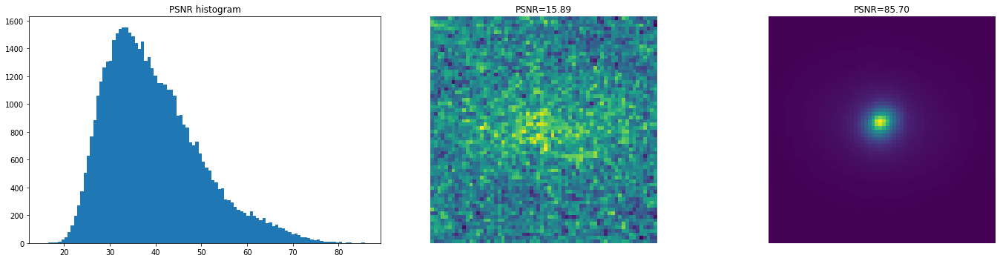

In [11]:
overview.Show_stats(galaxies,df,'PSNR',0,np.inf,2,False,False,False)

50799 Galaxies
PSNR [0.00,inf]


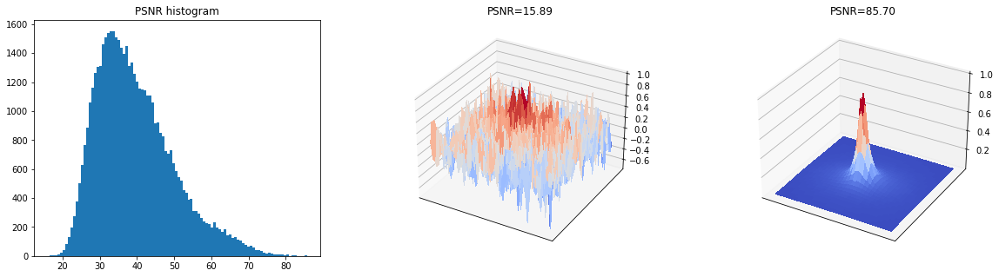

In [12]:
overview.Show_stats(galaxies,df,'PSNR',0,np.inf,3,False,False,False)

PSNR 15.887754962916423
Number of galaxies 50799


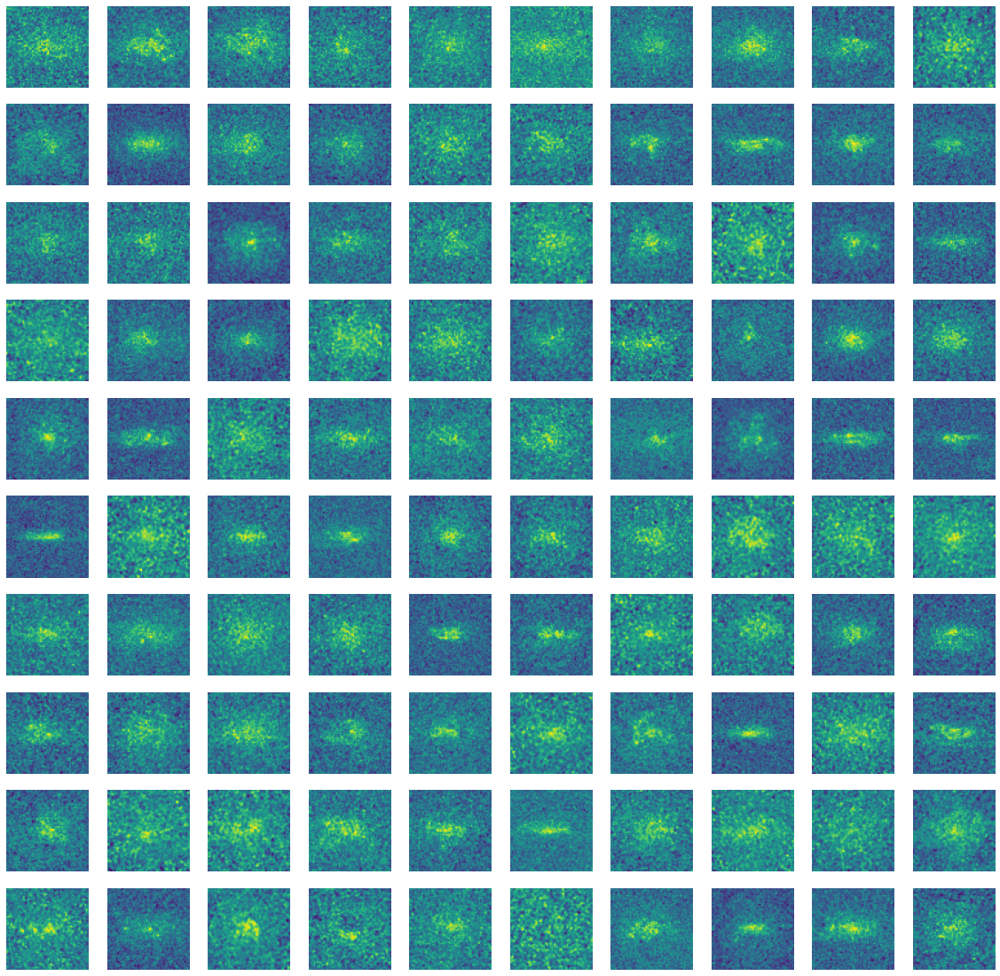

In [13]:
df_filt=overview.Show_filtered(galaxies,df,'PSNR',ascending=True,threshold=0,Index_from=0,invert_colors=False,cut_negatives=False)

PSNR 85.69576982198393
Number of galaxies 50799


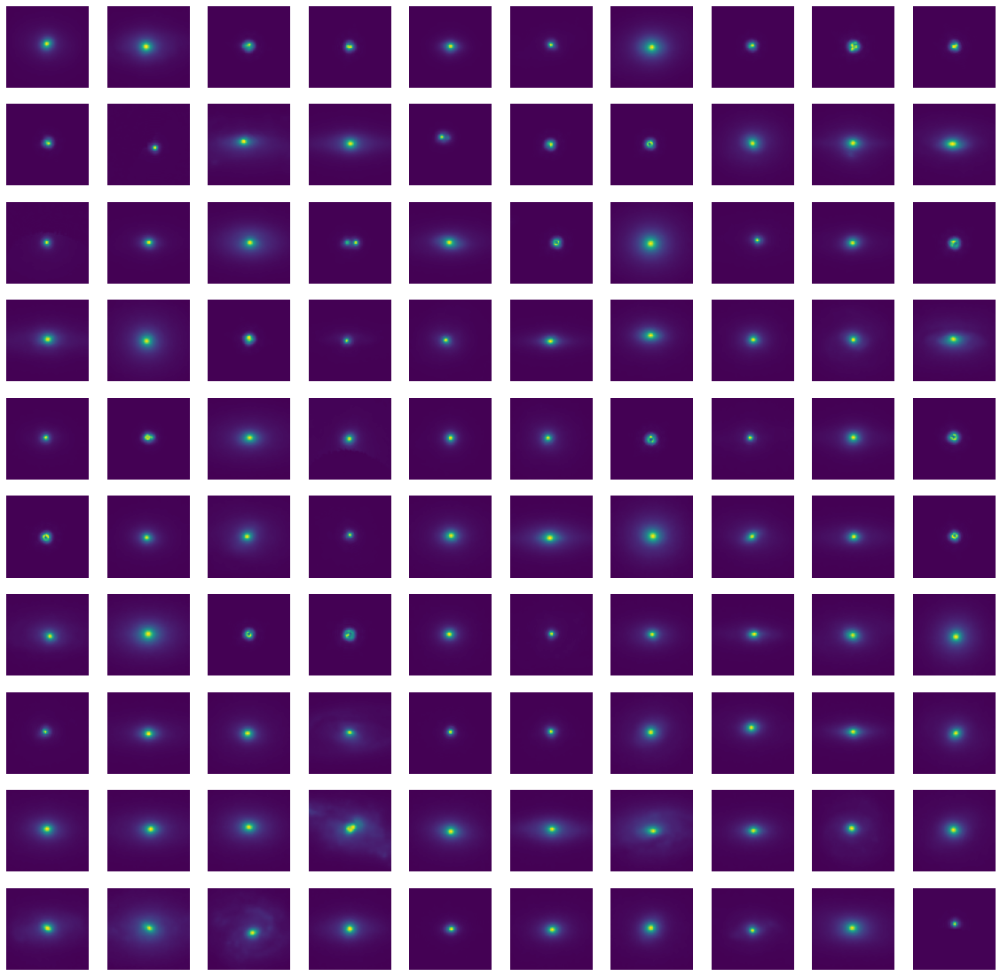

In [14]:
df_filt=overview.Show_filtered(galaxies,df,'PSNR',ascending=False,threshold=0,Index_from=0,invert_colors=False,cut_negatives=False)

## R_cut

50799 Galaxies
R_cut [0.00,inf]


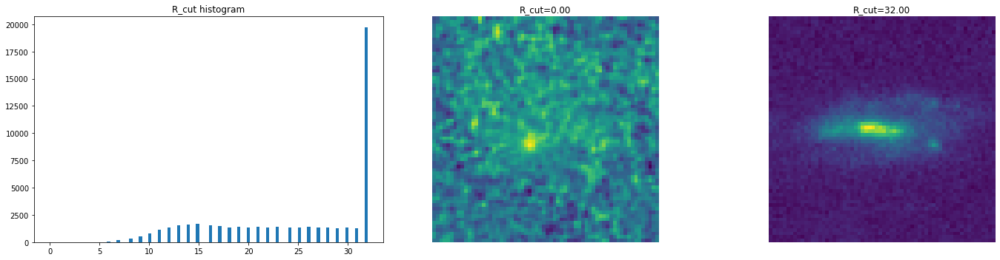

In [15]:
overview.Show_stats(galaxies,df,'R_cut',0,np.inf,2,False,True,False)

R_cut 0.0
Number of galaxies 50799


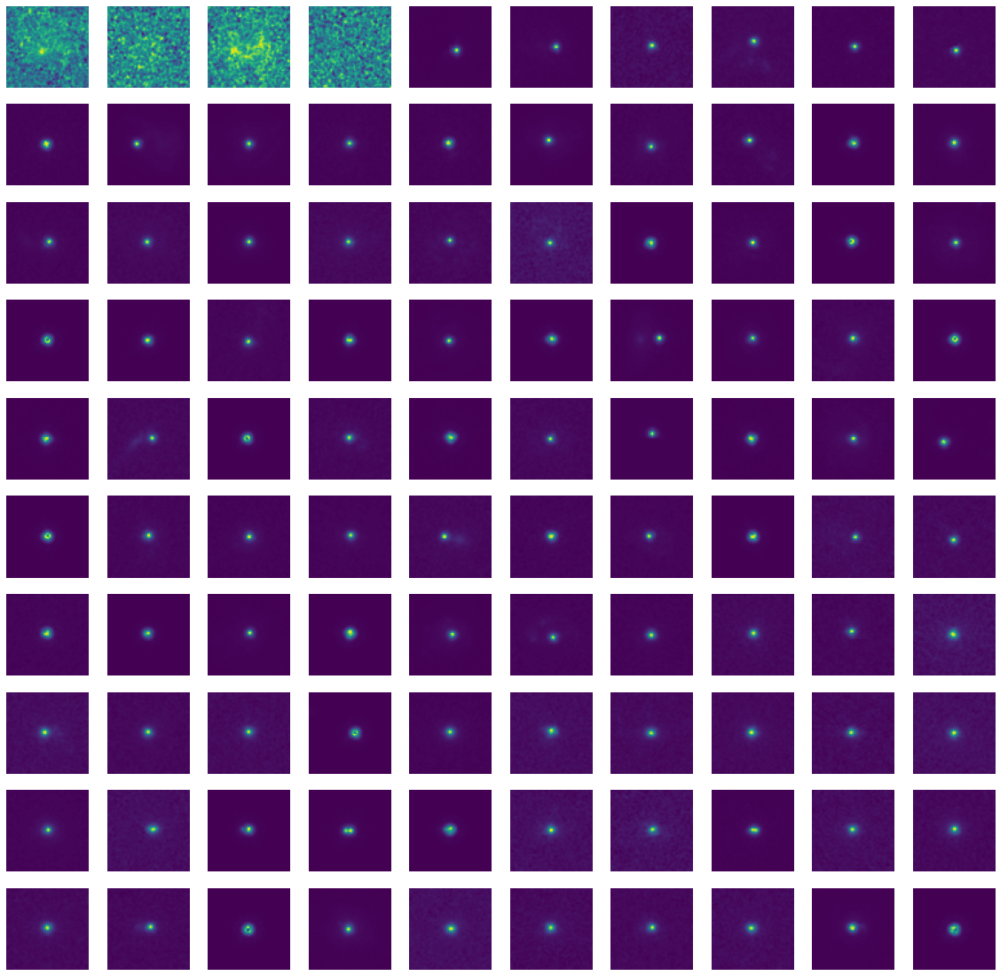

In [16]:
df_filt=overview.Show_filtered(galaxies,df,'R_cut',ascending=True,threshold=0,Index_from=0,invert_colors=False,cut_negatives=False)

## NonUniformity

50799 Galaxies
NonUniformity [0.00,inf]


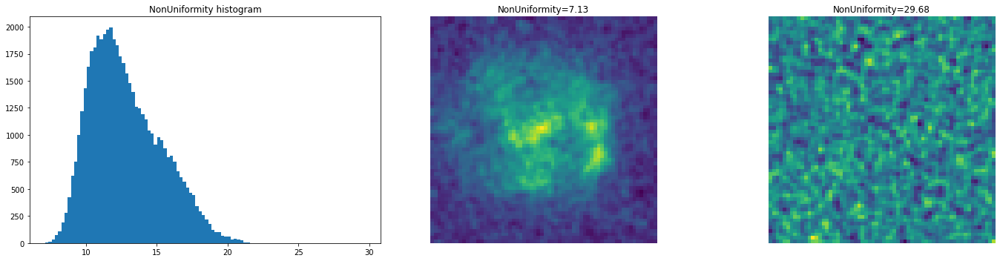

In [17]:
overview.Show_stats(galaxies,df,'NonUniformity',0,np.inf,2,False,True,False)

NonUniformity 29.67506610954215
Number of galaxies 50799


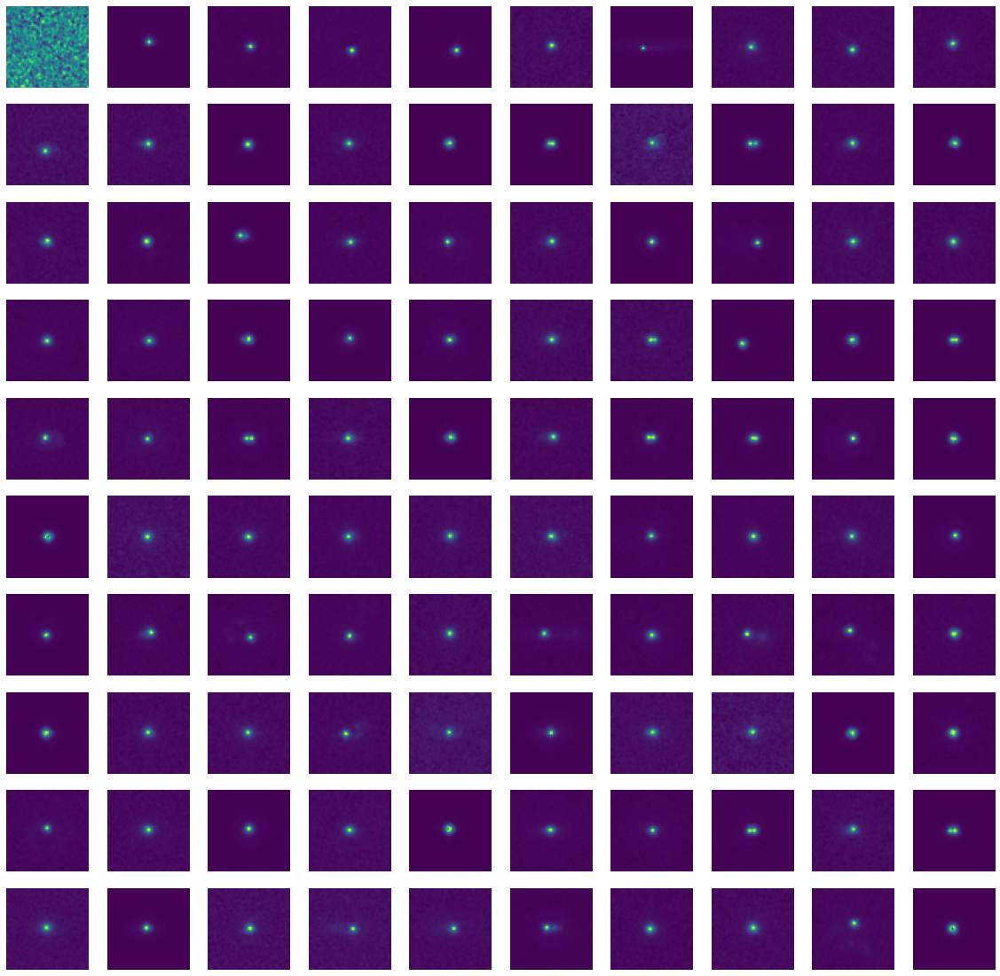

In [18]:
df_filt=overview.Show_filtered(galaxies,df,'NonUniformity',ascending=False,threshold=0,Index_from=0,invert_colors=False,cut_negatives=False)

## COSMOS_Sersic_n

50690 Galaxies
COSMOS_Sersic_n [0.11,inf]


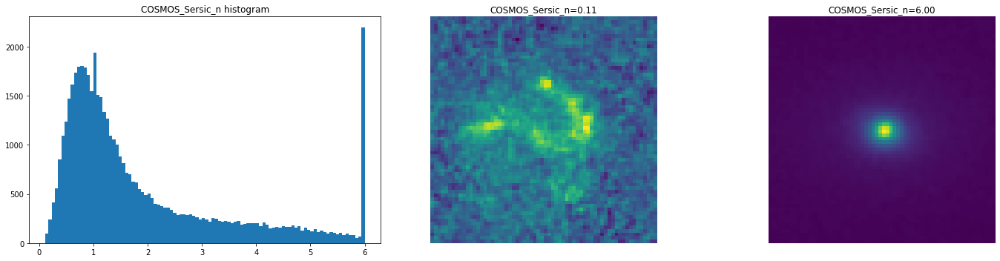

In [21]:
overview.Show_stats(galaxies,df,'COSMOS_Sersic_n',0.11,np.inf,2,False,True,False)

COSMOS_Sersic_n 6.0
Number of galaxies 50799


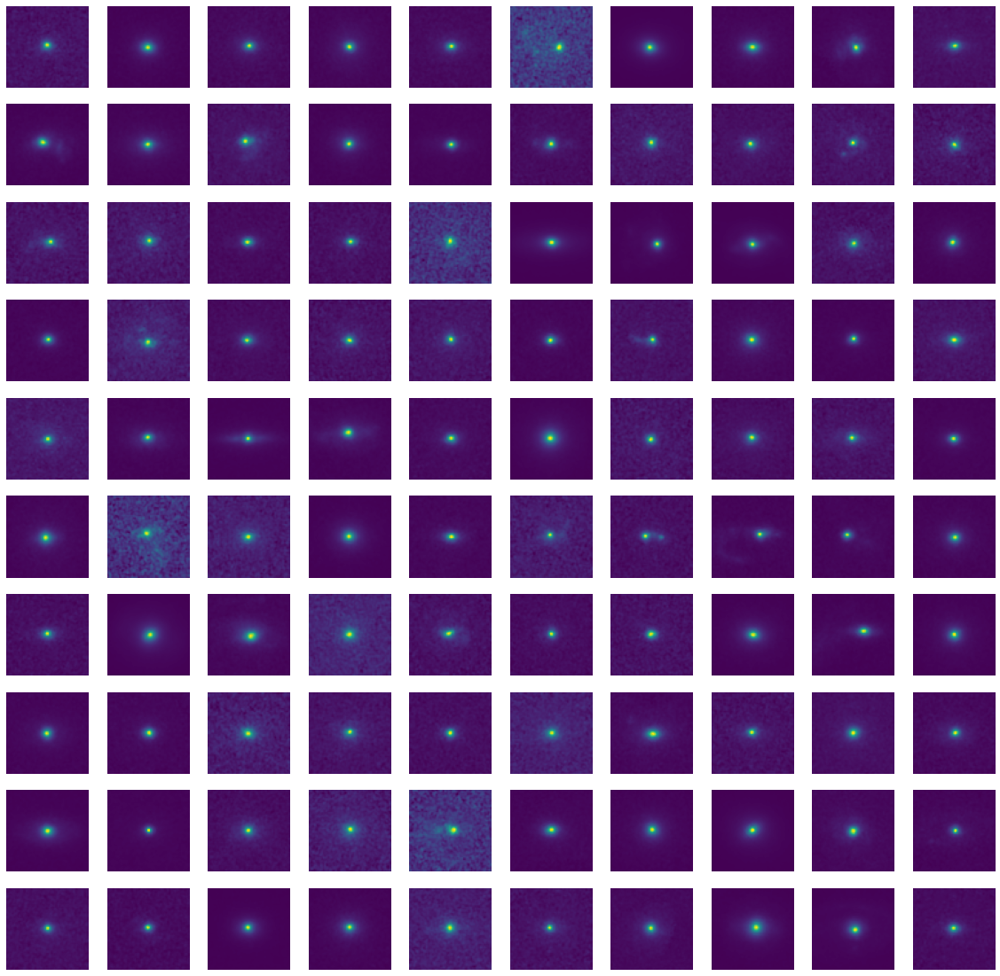

In [20]:
df_filt=overview.Show_filtered(galaxies,df,'COSMOS_Sersic_n',ascending=False,threshold=0,Index_from=0,invert_colors=False,cut_negatives=False)

# Dataset filtering

## Dot-like filter

### R_cut

R_cut 15.0
Number of galaxies 43417


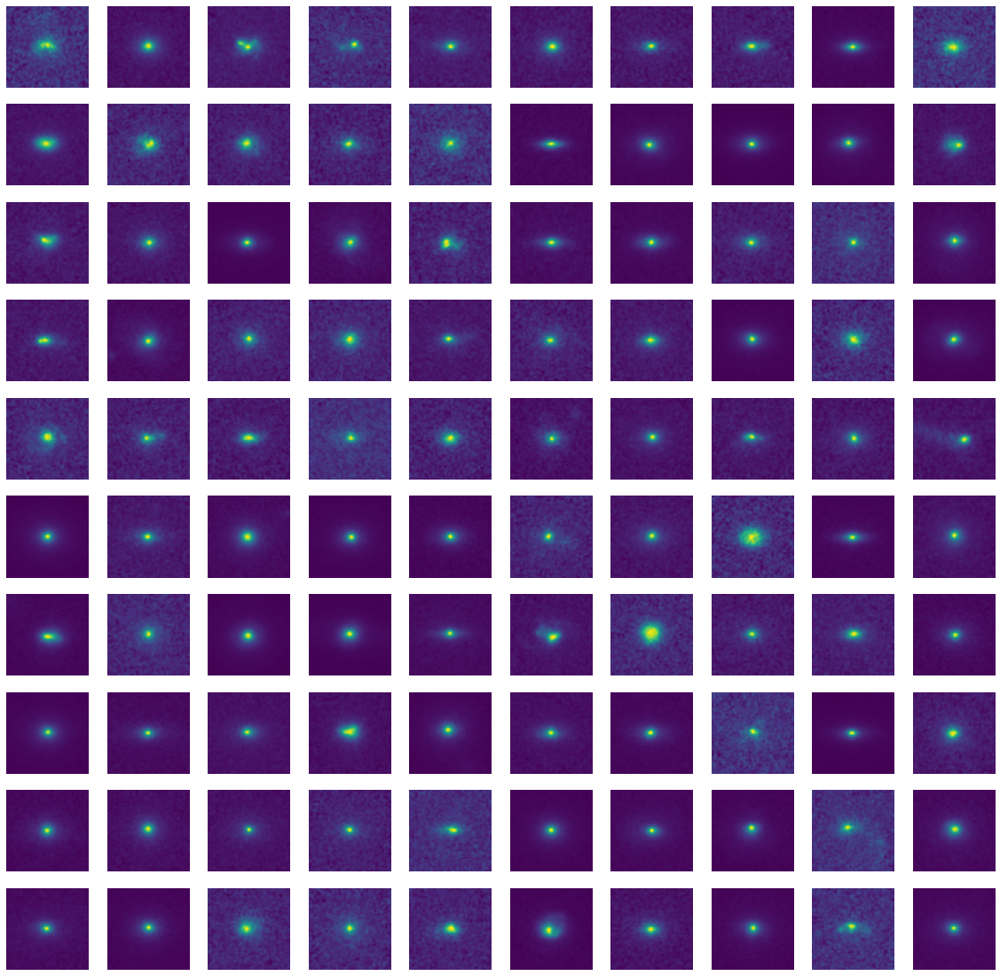

In [22]:
threshold=15
df_filt=overview.Show_filtered(galaxies,df,'R_cut',ascending=True,threshold=threshold,Index_from=0,invert_colors=False,cut_negatives=False)

### NonUniformity

NonUniformity 14.999739167185645
Number of galaxies 40348


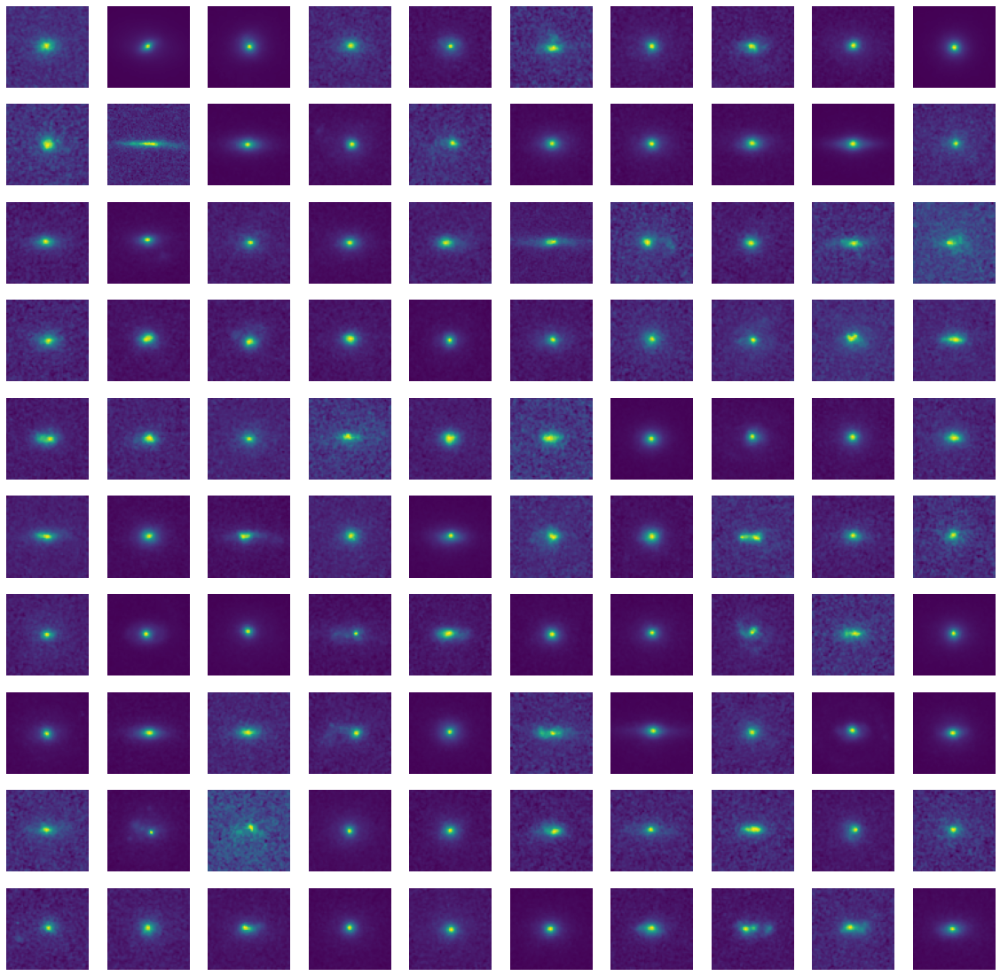

In [23]:
threshold=15
df_filt=overview.Show_filtered(galaxies,df,'NonUniformity',ascending=False,threshold=threshold,Index_from=0,invert_colors=False,cut_negatives=False)

### COSMOS_Sersic_n

16055 Galaxies
COSMOS_Sersic_n [2.00,inf]


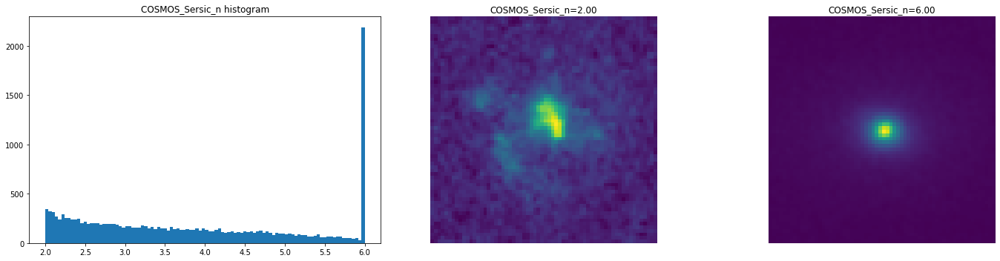

In [24]:
overview.Show_stats(galaxies,df,'COSMOS_Sersic_n',2,np.inf,2,False,False,False)

COSMOS_Sersic_n 2.300234149490555
Number of galaxies 13886


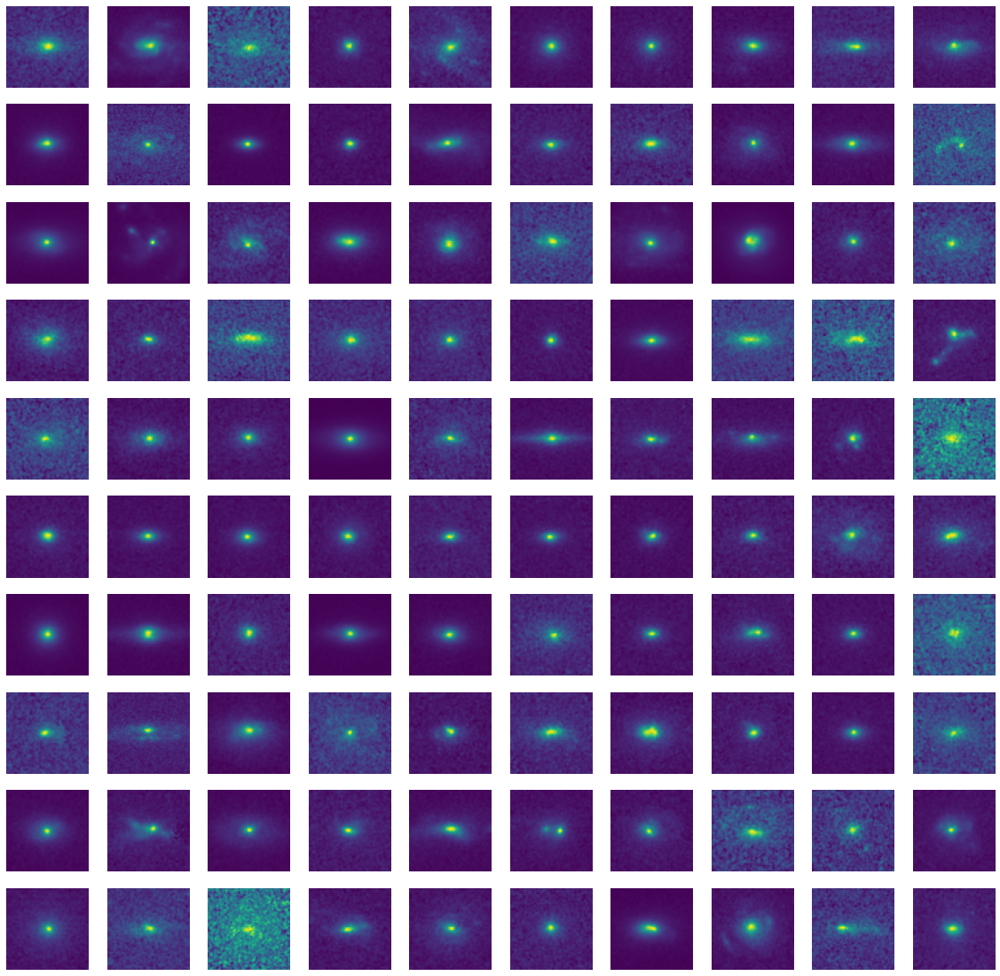

In [25]:
threshold=2.3
df_filt=overview.Show_filtered(galaxies,df,'COSMOS_Sersic_n',ascending=True,threshold=threshold,Index_from=0,invert_colors=False,cut_negatives=False)

In [26]:
mask_dot_like=(df.NonUniformity>=15) | (df.COSMOS_Sersic_n>=2.3) | (df.R_cut<15)

## Non Dot-like galaxies

The residual galaxies are likely to have some structure. Not like PSF-spreaded dot-like ones.

NonUniformity 14.999739167185645
Number of galaxies 34268


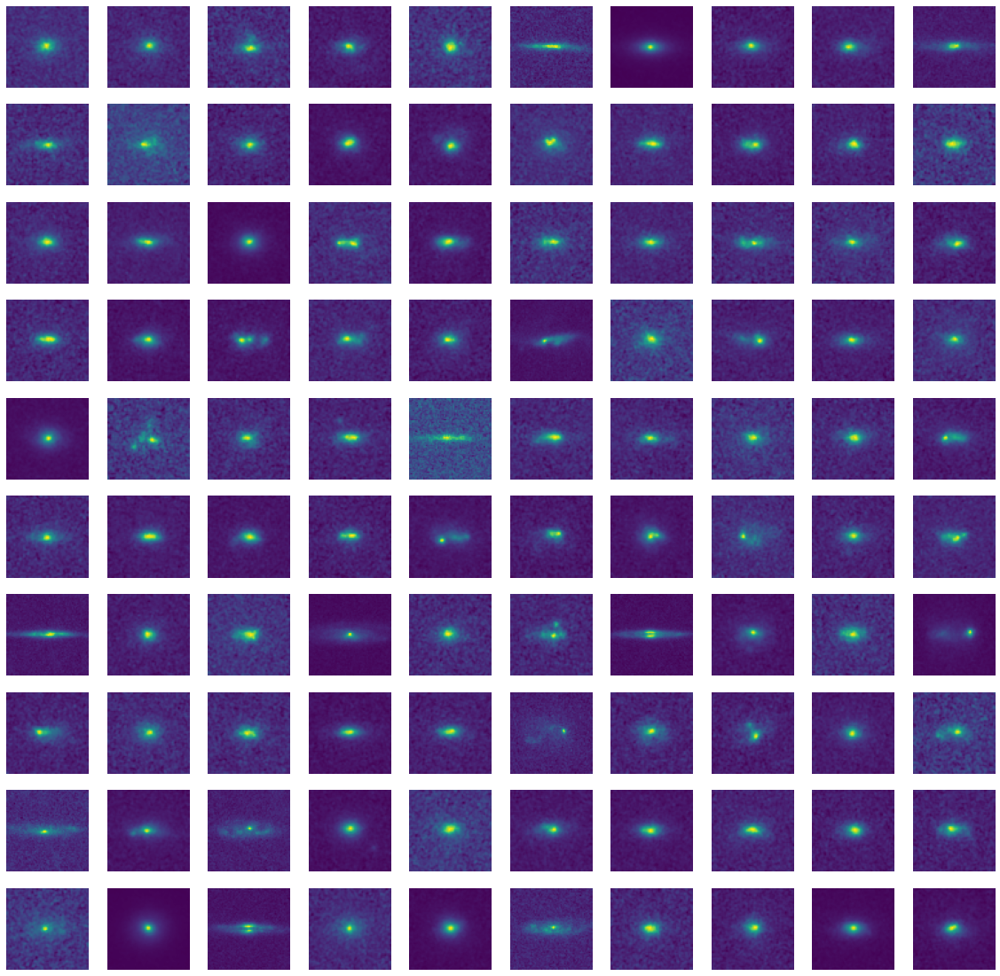

In [27]:
threshold=0
df_filt=overview.Show_filtered(galaxies,df[~mask_dot_like],'NonUniformity',ascending=False,threshold=threshold,Index_from=0,invert_colors=False,cut_negatives=False)

COSMOS_Sersic_n 2.2998305278458204
Number of galaxies 34268


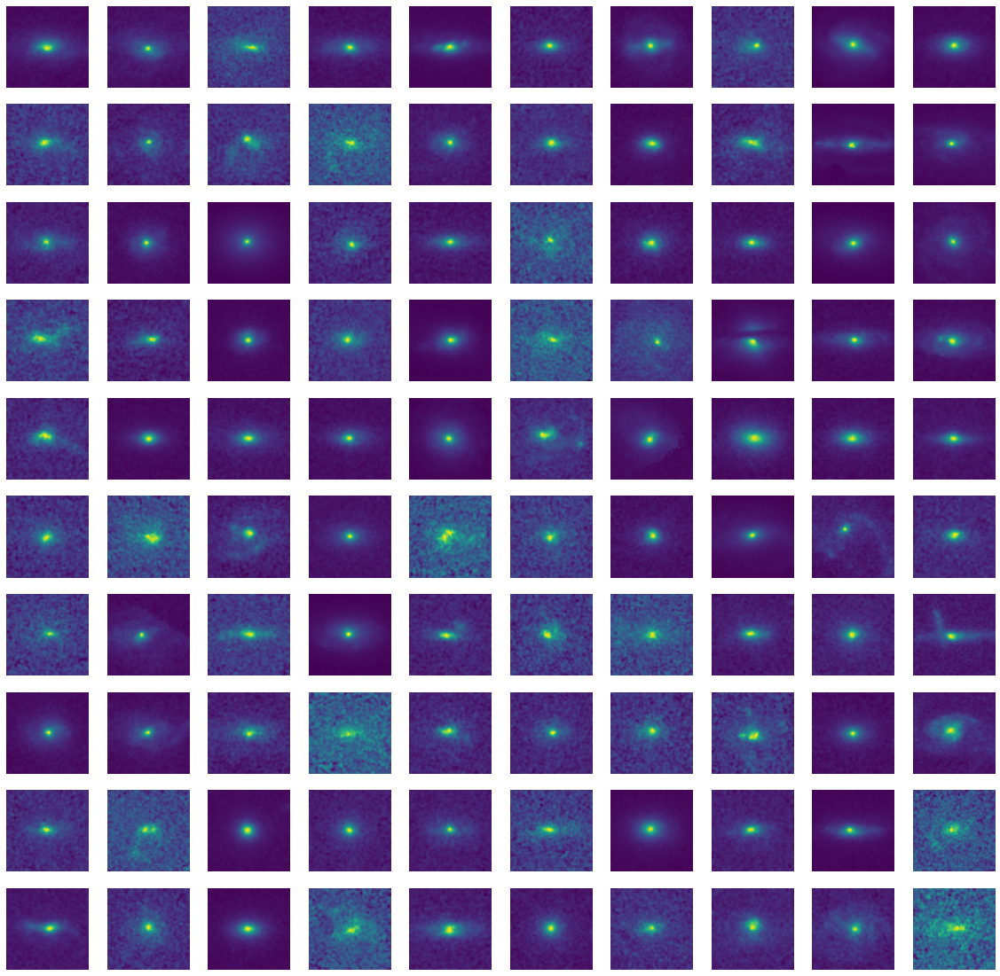

In [28]:
threshold=0
df_filt=overview.Show_filtered(galaxies,df[~mask_dot_like],'COSMOS_Sersic_n',ascending=False,threshold=threshold,Index_from=0,invert_colors=False,cut_negatives=False)

## SNR filter

In [ ]:
PSNR=20*log10(max_I/gaussian_sigma)

25475 Galaxies
PSNR [30.00,inf]


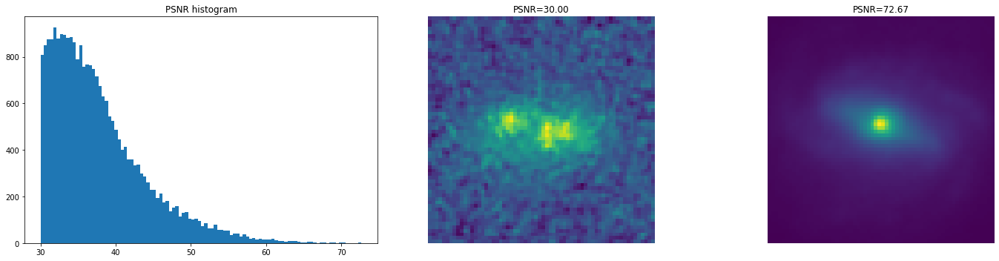

In [29]:
overview.Show_stats(galaxies,df[~mask_dot_like],'PSNR',30,np.inf,2,False,False,False)

25475 Galaxies
PSNR [30.00,inf]


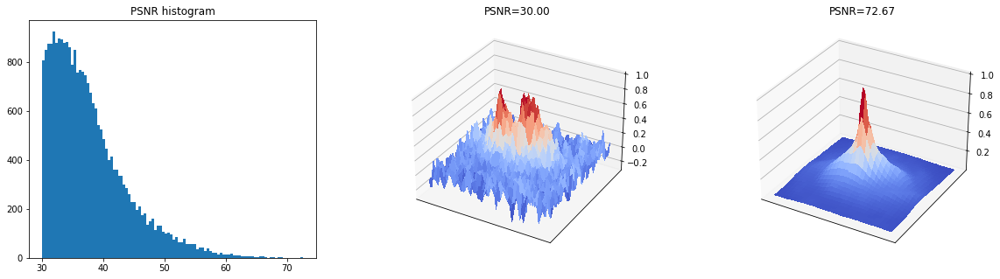

In [30]:
overview.Show_stats(galaxies,df[~mask_dot_like],'PSNR',30,np.inf,3,False,False,False)

In [286]:
from matplotlib import cm

def present_3d_image(image):
  X = np.arange(0, image.shape[0], 1)
  Y = np.arange(0, image.shape[1], 1)
  X, Y = np.meshgrid(X, Y)

  fig, ax = plt.subplots(subplot_kw={"projection": "3d"})
  surf = ax.plot_surface(X, Y, image, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)
  ax.set_xticks([])
  ax.set_yticks([])

  plt.figure(3)
  plt.imshow(image,cmap='viridis')
  plt.show()

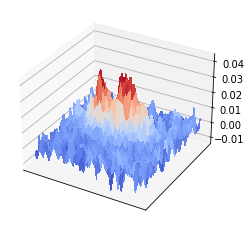

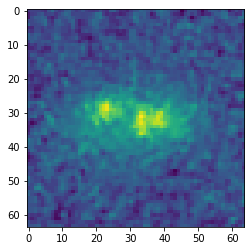

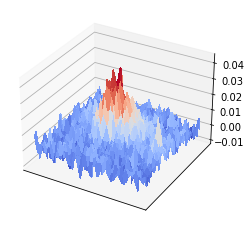

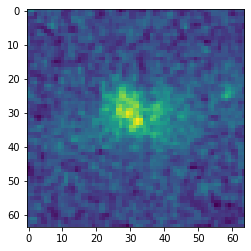

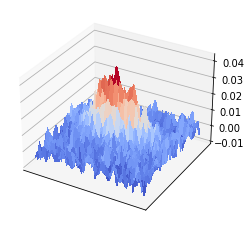

...

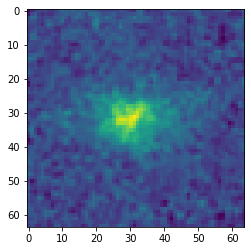

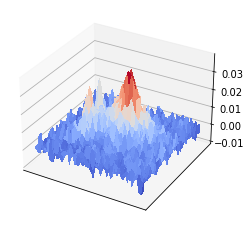

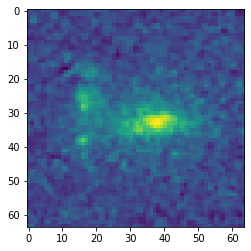

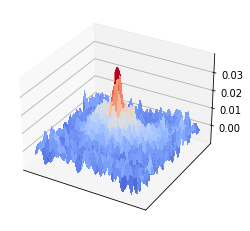

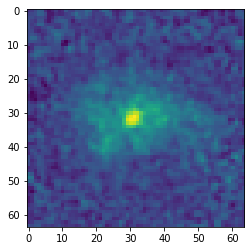

In [287]:
for i in range(10):
    present_3d_image(galaxies[df_filt.iloc[i].name])

PSNR 30.001925432267463
Number of galaxies 25475


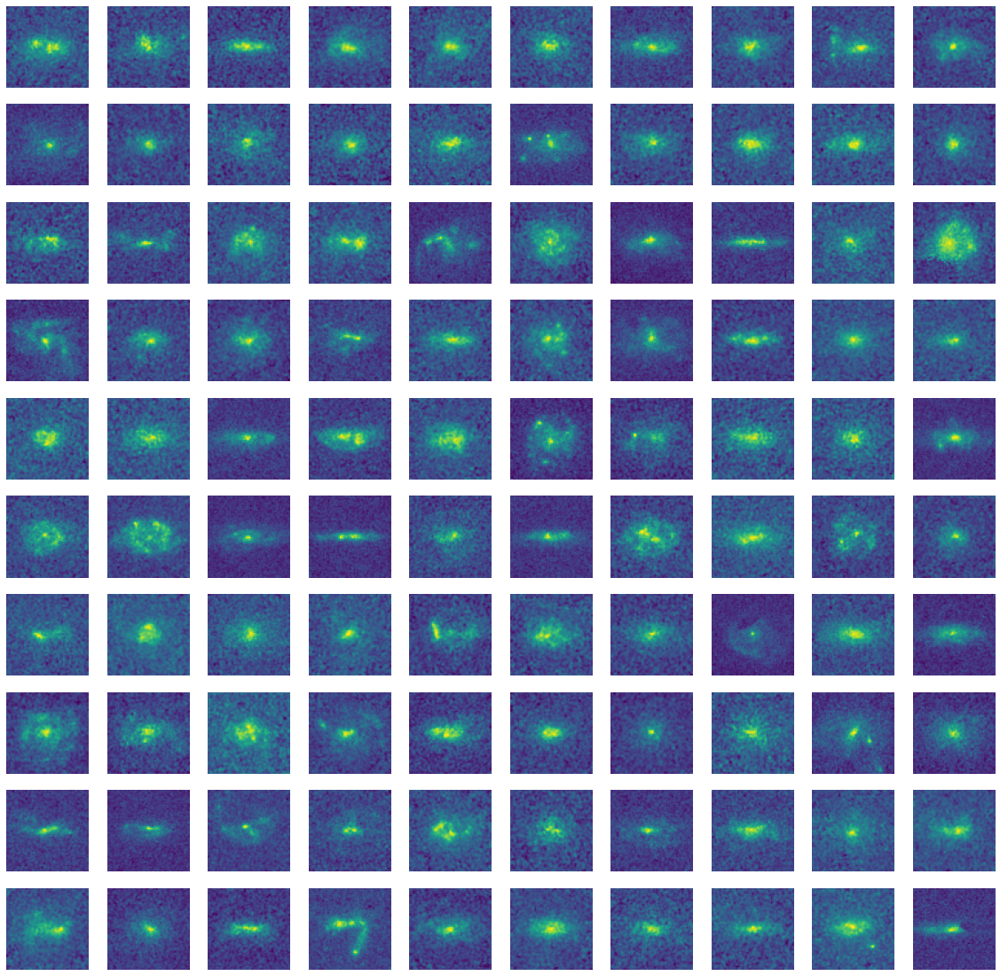

In [31]:
df_filt=overview.Show_filtered(galaxies,df[~mask_dot_like],'PSNR',ascending=True,threshold=30,Index_from=0,invert_colors=False,cut_negatives=False)

I don't think that there is any sense in taking anything below PSNR=30. Let's stick to this value

In [54]:
mask=(df.PSNR>=30) & ~mask_dot_like
print(mask.sum())

25475


# Overview of filtered dataset

PSNR 30.001925432267463
Number of galaxies 25475


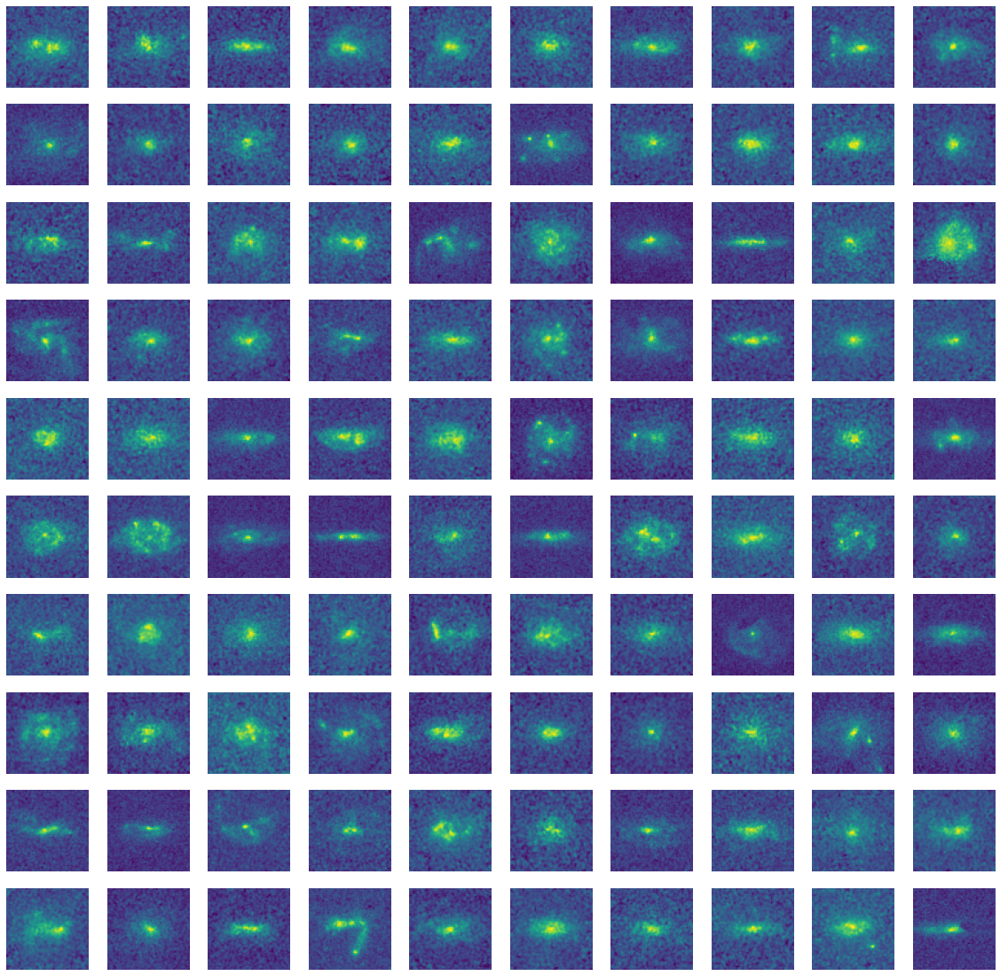

In [55]:
df_filt=overview.Show_filtered(galaxies,df[mask],'PSNR',ascending=True,threshold=0,Index_from=0,invert_colors=False,cut_negatives=False)

NonUniformity 7.128164386083515
Number of galaxies 25475


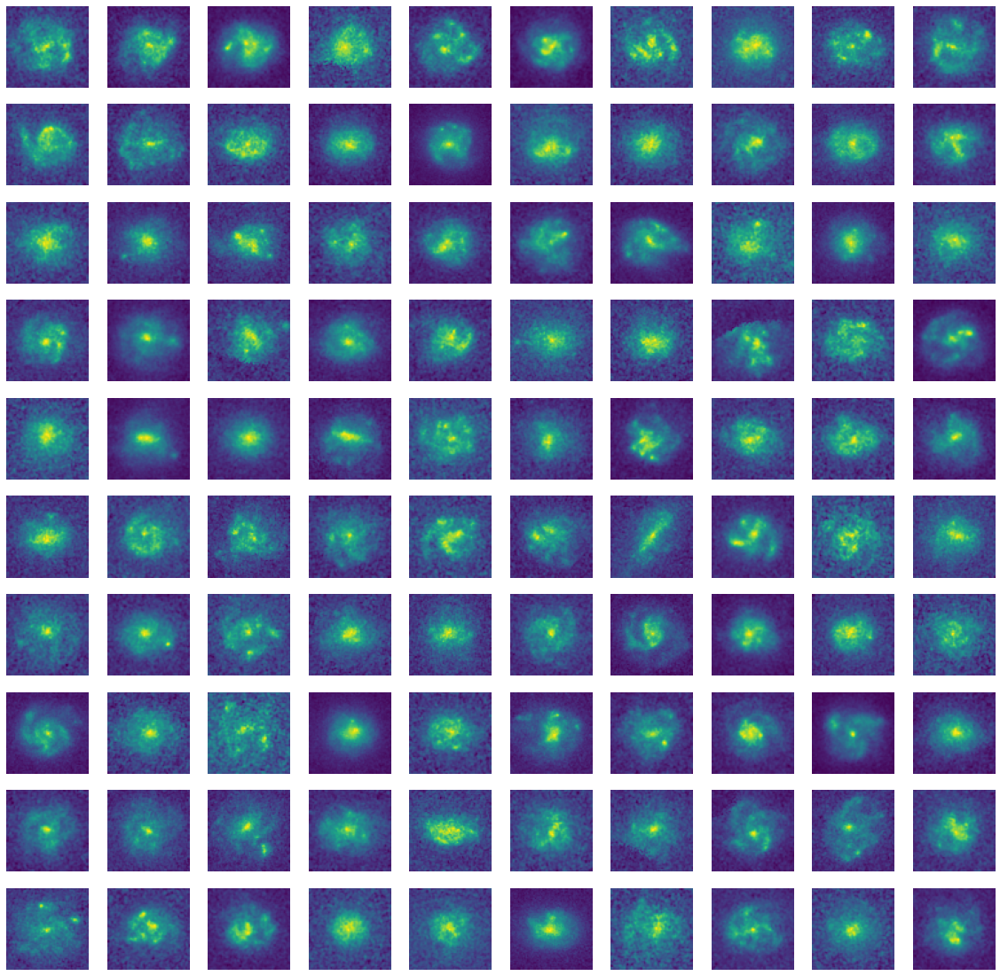

In [56]:
df_filt=overview.Show_filtered(galaxies,df[mask],'NonUniformity',ascending=True,threshold=0,Index_from=0,invert_colors=False,cut_negatives=False)